### Author:----> Abhishek Kumar
### Project:----> Regular Mall Visiting Customers Sentiment Analysis Project

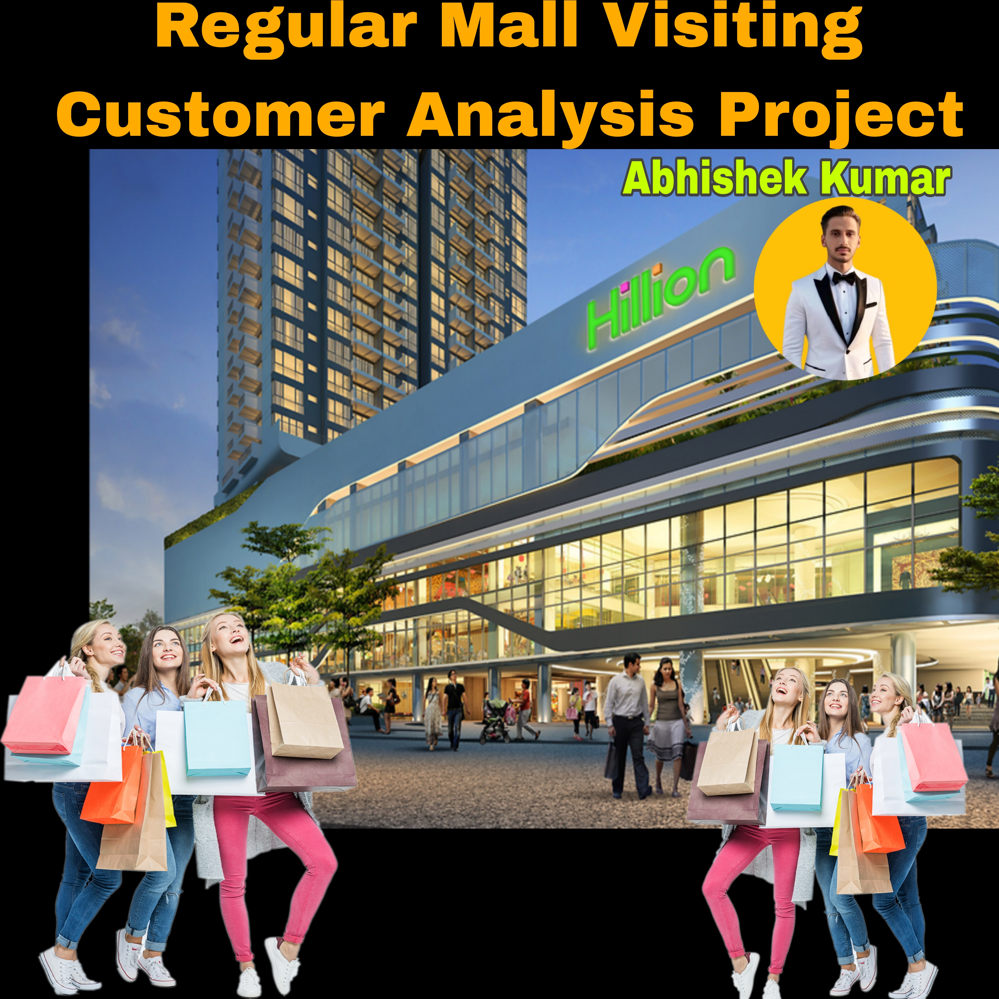

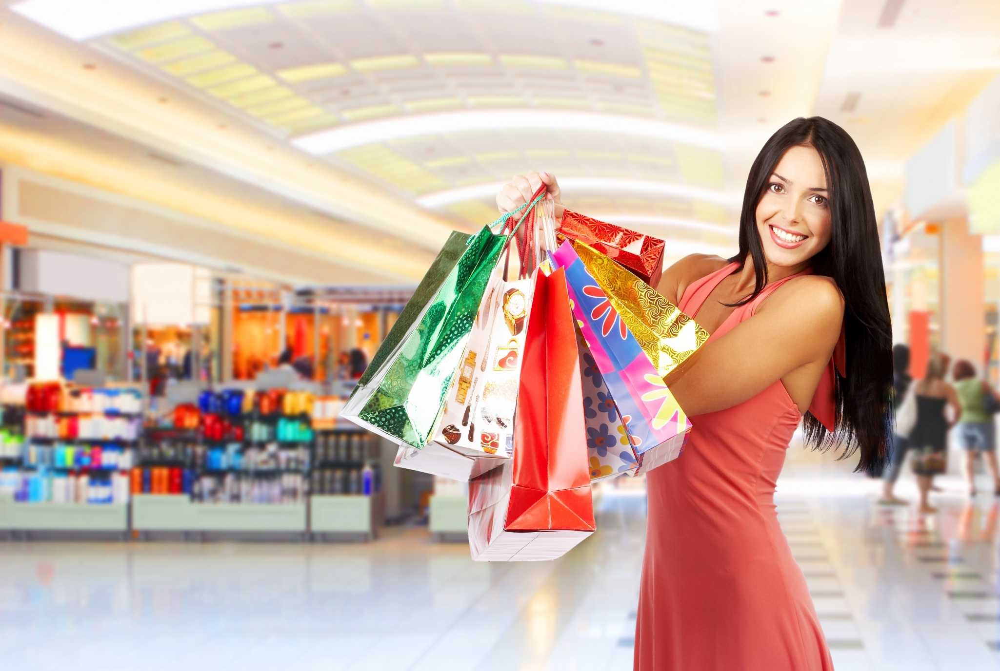

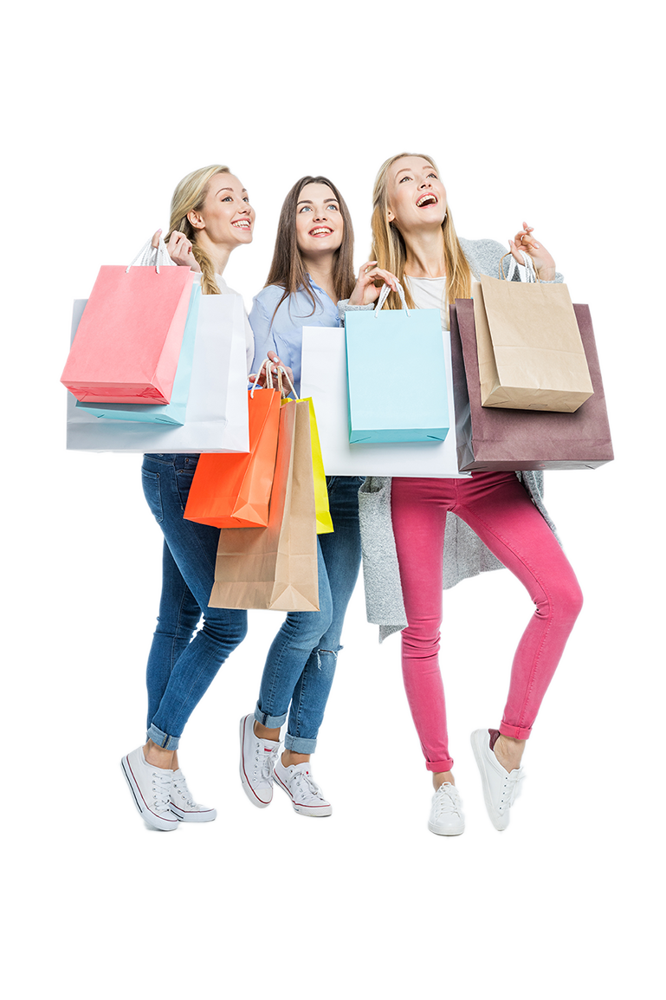


# Exploratory Data Analysis (EDA) on Kaggle Dataset

## Overview
This notebook performs an in-depth Exploratory Data Analysis (EDA) on a dataset downloaded from Kaggle. It explores both categorical and numerical variables to uncover patterns, relationships, and insights. All analysis is accompanied by visualizations to aid understanding.

## Goals
1. Conduct univariate and bivariate analysis.
2. Visualize trends and distributions of numerical and categorical data.
3. Answer key exploratory questions to gain actionable insights.
4. Ensure clear documentation and meaningful insights after each step.

---


#### Step1:----> Import all the important Library

In [1]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

# Ignore specific warnings
warnings.filterwarnings("ignore", category=FutureWarning)

#### Step2:---> Now Load the dataset from the Csv File

In [5]:
data = pd.read_csv("Mall_Customers.csv")

data.head()

,CustomerID,Genre,Age,Annual Income (k$),Spending Score (1-100)
0,1,Male,19,15,39
1,2,Male,21,15,81
2,3,Female,20,16,6
3,4,Female,23,16,77
4,5,Female,31,17,40



## Dataset Overview
- **Shape**: The dataset contains `data.shape[0]` rows and `data.shape[1]` columns.
- **Columns**:
    - **CustomerID**: Unique ID for each customer.
    - **Genre**: Gender of the customer (Male/Female).
    - **Age**: Age of the customer.
    - **Annual Income (k$)**: Annual income in thousand dollars.
    - **Spending Score (1-100)**: Score assigned based on customer behavior and spending nature.
    
Below is the dataset's information:


#### Step3:---> Check the Top 5 Rows of dataset:---

In [9]:
data.head()

,CustomerID,Genre,Age,Annual Income (k$),Spending Score (1-100)
0,1,Male,19,15,39
1,2,Male,21,15,81
2,3,Female,20,16,6
3,4,Female,23,16,77
4,5,Female,31,17,40


#### Step4:----> Check last 5 Rows of the dataset:---

In [13]:
data.tail()

,CustomerID,Genre,Age,Annual Income (k$),Spending Score (1-100)
195,196,Female,35,120,79
196,197,Female,45,126,28
197,198,Male,32,126,74
198,199,Male,32,137,18
199,200,Male,30,137,83


#### Step5:---> Check the Total Information of the dataset:---

In [16]:

data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200 entries, 0 to 199
Data columns (total 5 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   CustomerID              200 non-null    int64 
 1   Genre                   200 non-null    object
 2   Age                     200 non-null    int64 
 3   Annual Income (k$)      200 non-null    int64 
 4   Spending Score (1-100)  200 non-null    int64 
dtypes: int64(4), object(1)
memory usage: 7.9+ KB


#### Step6:---> Perform Statical Analysis Of the Dataset:---

In [21]:
data.describe()

,CustomerID,Age,Annual Income (k$),Spending Score (1-100)
count,200.000000,200.000000,200.000000,200.000000
mean,100.500000,38.850000,60.560000,50.200000
std,57.879185,13.969007,26.264721,25.823522
min,1.000000,18.000000,15.000000,1.000000
25%,50.750000,28.750000,41.500000,34.750000
50%,100.500000,36.000000,61.500000,50.000000
75%,150.250000,49.000000,78.000000,73.000000
max,200.000000,70.000000,137.000000,99.000000


In [19]:
data.describe

<bound method NDFrame.describe of      CustomerID   Genre  Age  Annual Income (k$)  Spending Score (1-100)
0             1    Male   19                  15                      39
1             2    Male   21                  15                      81
2             3  Female   20                  16                       6
3             4  Female   23                  16                      77
4             5  Female   31                  17                      40
..          ...     ...  ...                 ...                     ...
195         196  Female   35                 120                      79
196         197  Female   45                 126                      28
197         198    Male   32                 126                      74
198         199    Male   32                 137                      18
199         200    Male   30                 137                      83

[200 rows x 5 columns]>

In [23]:
data.size

1000

In [25]:
data.shape

(200, 5)

In [29]:
data.isnull().sum()

CustomerID                0
Genre                     0
Age                       0
Annual Income (k$)        0
Spending Score (1-100)    0
dtype: int64

In [31]:
data.columns

Index(['CustomerID', 'Genre', 'Age', 'Annual Income (k$)',
       'Spending Score (1-100)'],
      dtype='object')


### Missing Values
Let's check if there are any missing values in the dataset:


In [3]:

missing_values = data.isnull().sum()
missing_values


CustomerID                0
Gender                    0
Age                       0
Annual Income (k$)        0
Spending Score (1-100)    0
dtype: int64


## Univariate Analysis: Numerical Data
Here we analyze the distribution of numerical columns using box plots and histograms to identify patterns, central tendencies, and outliers.


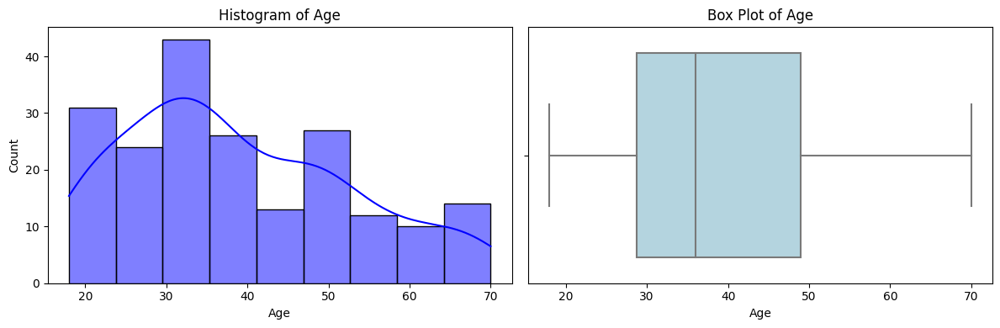

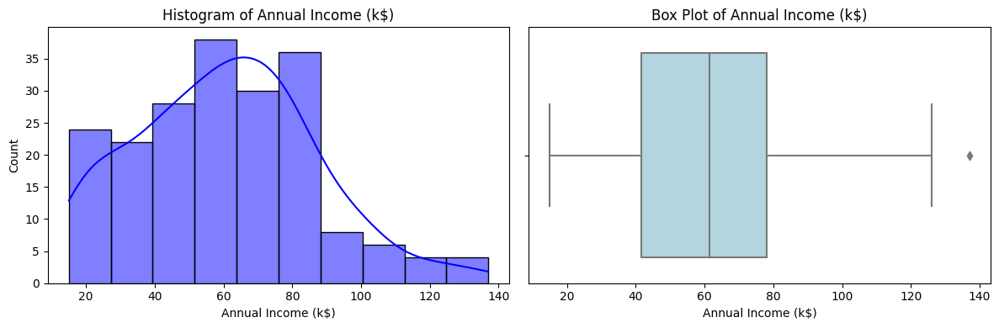

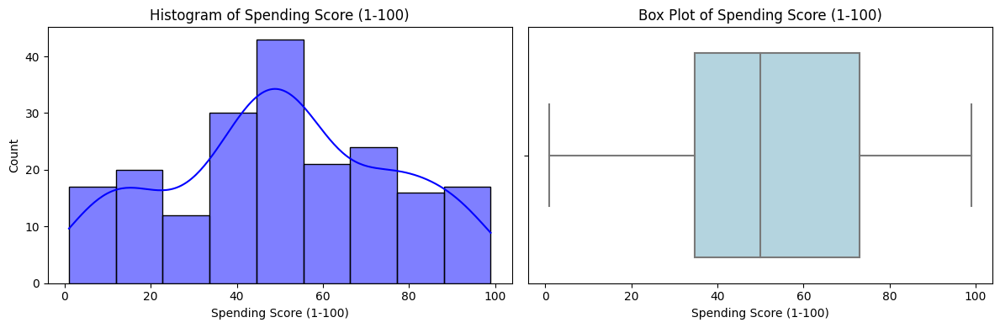

In [4]:

numeric_columns = ['Age', 'Annual Income (k$)', 'Spending Score (1-100)']

for col in numeric_columns:
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    sns.histplot(data[col], kde=True, ax=axes[0], color='blue')
    axes[0].set_title(f'Histogram of {col}')
    sns.boxplot(x=data[col], ax=axes[1], color='lightblue')
    axes[1].set_title(f'Box Plot of {col}')
    plt.tight_layout()
    plt.show()



## Univariate Analysis: Categorical Data
We analyze the categorical column `Genre` to understand the distribution of customer gender.


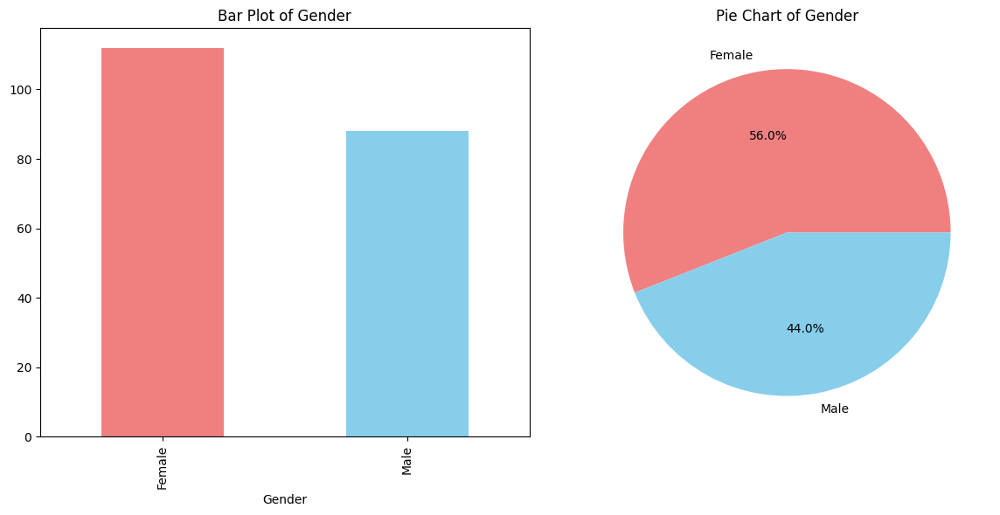

In [5]:

fig, axes = plt.subplots(1, 2, figsize=(12, 6))
data['Gender'].value_counts().plot(kind='bar', ax=axes[0], color=['lightcoral', 'skyblue'])
axes[0].set_title('Bar Plot of Gender')
data['Gender'].value_counts().plot(kind='pie', autopct='%1.1f%%', ax=axes[1], colors=['lightcoral', 'skyblue'])
axes[1].set_title('Pie Chart of Gender')
axes[1].set_ylabel('')
plt.tight_layout()
plt.show()



## Bivariate Analysis
### Correlation Heatmap
A heatmap is used to visualize correlations among numerical features.


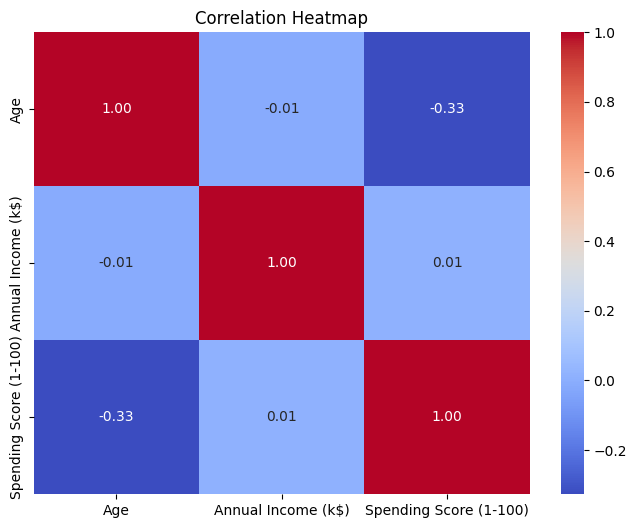

In [6]:
plt.figure(figsize=(8, 6))
sns.heatmap(data[numeric_columns].corr(), annot=True, cmap='coolwarm', fmt='.2f', cbar=True)
plt.title('Correlation Heatmap')
plt.show()


### Scatter Plot with Regression Line
We assess the relationship between **Age** and **Spending Score** using a scatter plot with a regression line to capture any linear trends.


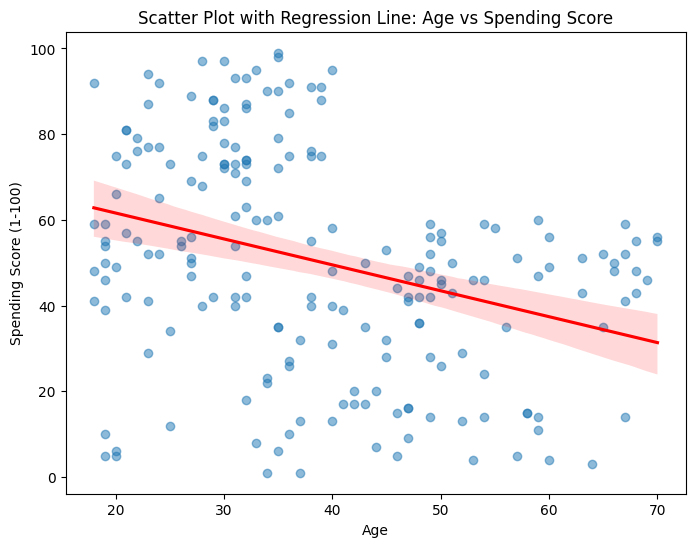

In [7]:

plt.figure(figsize=(8, 6))
sns.regplot(x='Age', y='Spending Score (1-100)', data=data, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('Scatter Plot with Regression Line: Age vs Spending Score')
plt.xlabel('Age')
plt.ylabel('Spending Score (1-100)')
plt.show()



### Line Plot for Numerical Trends
We use a line plot to observe the relationship between **Annual Income** and **Spending Score** across the dataset.


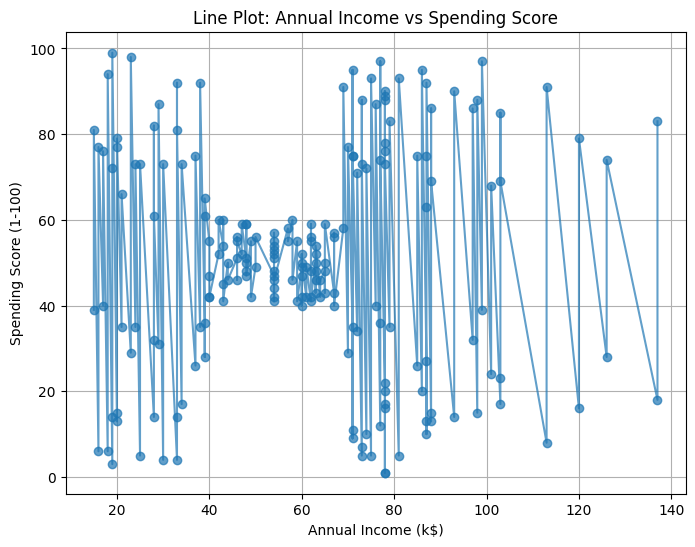

In [8]:

plt.figure(figsize=(8, 6))
plt.plot(data['Annual Income (k$)'], data['Spending Score (1-100)'], marker='o', linestyle='-', alpha=0.7)
plt.title('Line Plot: Annual Income vs Spending Score')
plt.xlabel('Annual Income (k$)')
plt.ylabel('Spending Score (1-100)')
plt.grid(True)
plt.show()



### KDE Plot for Density Visualization
The KDE plot helps us understand the density distributions of **Age** and **Spending Score** to identify any overlaps or unique patterns in their distributions.


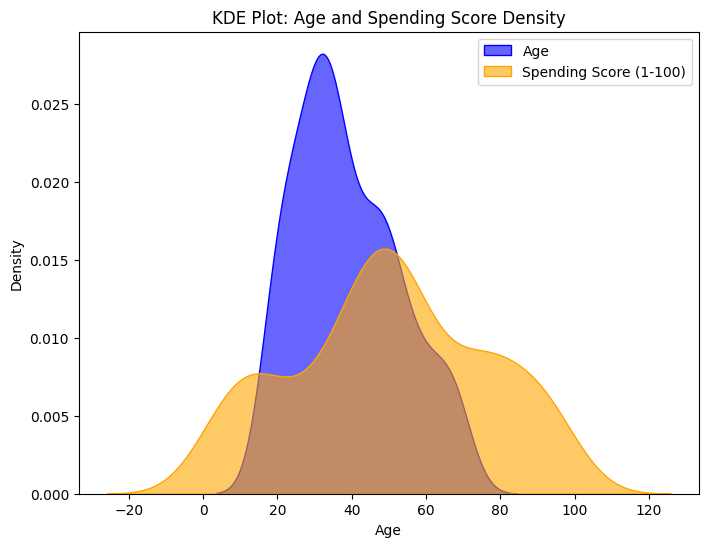

In [9]:

plt.figure(figsize=(8, 6))
sns.kdeplot(data['Age'], fill=True, color='blue', alpha=0.6, label='Age')
sns.kdeplot(data['Spending Score (1-100)'], fill=True, color='orange', alpha=0.6, label='Spending Score (1-100)')
plt.title('KDE Plot: Age and Spending Score Density')
plt.legend()
plt.show()



## Exploratory Questions and Insights

Here are key questions answered with the dataset:

1. What is the distribution of genders?
2. Who are the top 5 customers with the highest spending score?
3. What is the average annual income by gender?
4. How does age correlate with spending score?
5. What are the descriptive statistics for annual income?



### Supporting Graphs for Exploratory Questions

#### 1. What is the distribution of genders?
This bar chart shows the distribution of customers across genders.


Gender Distribution:
Gender
Female    112
Male       88
Name: count, dtype: int64


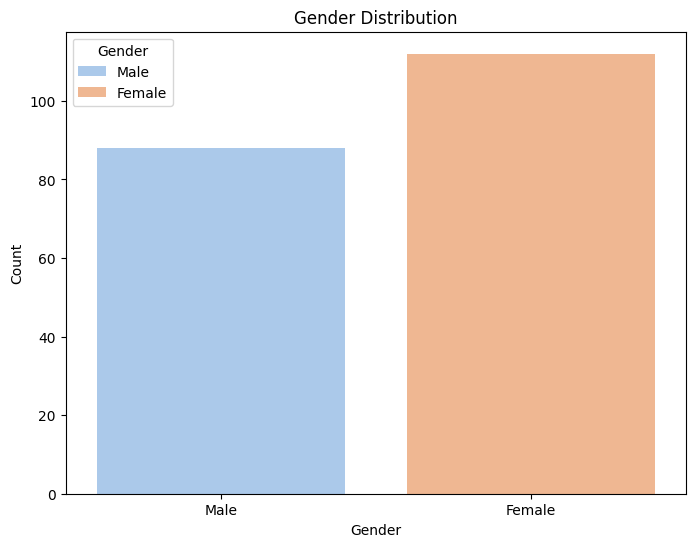

In [10]:
print("Gender Distribution:")
print(data['Gender'].value_counts())

plt.figure(figsize=(8, 6))
sns.countplot(data=data, x='Gender', hue='Gender', palette='pastel', dodge=False)
plt.title('Gender Distribution')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.show()




#### 2. Who are the top 5 customers with the highest spending score?
This bar chart highlights the top 5 customers with their spending scores.


Top 5 Customers with Highest Spending Score:
     CustomerID  Gender  Age  Annual Income (k$)  Spending Score (1-100)
11           12  Female   35                  19                      99
19           20  Female   35                  23                      98
145         146    Male   28                  77                      97
185         186    Male   30                  99                      97
127         128    Male   40                  71                      95


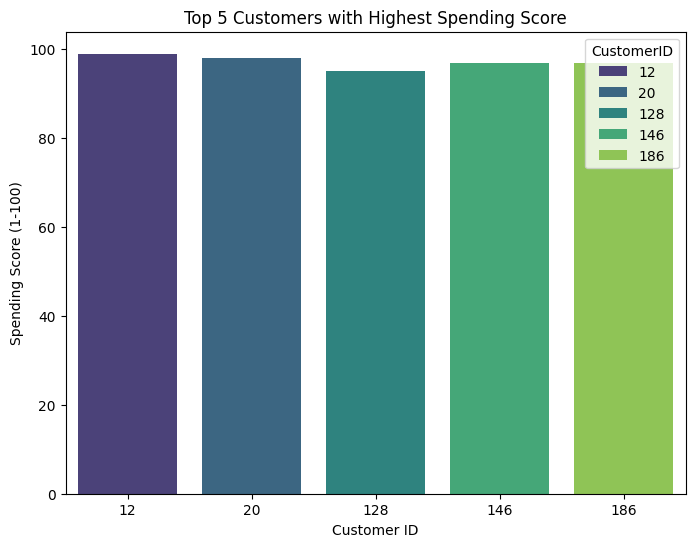

In [11]:
print("Top 5 Customers with Highest Spending Score:")
print(data.nlargest(5, 'Spending Score (1-100)'))

top_5_customers = data.nlargest(5, 'Spending Score (1-100)')
plt.figure(figsize=(8, 6))
sns.barplot(x='CustomerID', y='Spending Score (1-100)', data=top_5_customers, hue='CustomerID', palette='viridis', dodge=False)
plt.title('Top 5 Customers with Highest Spending Score')
plt.xlabel('Customer ID')
plt.ylabel('Spending Score (1-100)')
plt.show()



#### 3. What is the average annual income by gender?
This bar chart compares the average annual income for male and female customers.


Average Annual Income by Gender:
Gender
Female    59.250000
Male      62.227273
Name: Annual Income (k$), dtype: float64


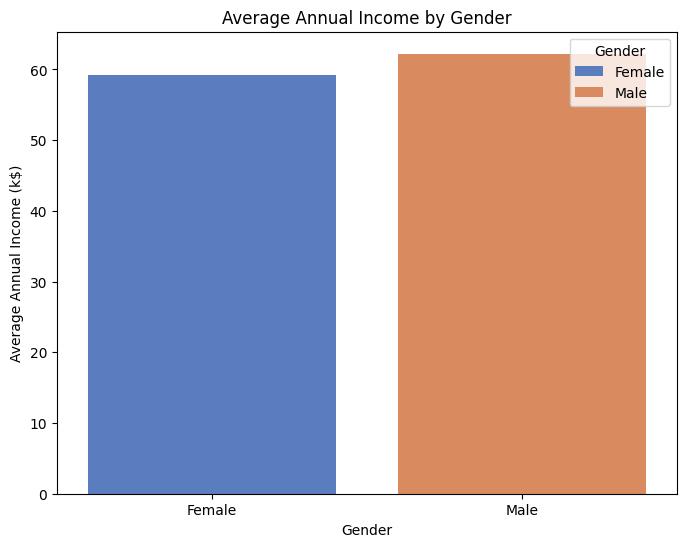

In [12]:
avg_income_gender = data.groupby('Gender')['Annual Income (k$)'].mean()
print("Average Annual Income by Gender:")
print(avg_income_gender)

avg_income_by_gender = data.groupby('Gender')['Annual Income (k$)'].mean().reset_index()
plt.figure(figsize=(8, 6))
sns.barplot(x='Gender', y='Annual Income (k$)', data=avg_income_by_gender, hue='Gender', palette='muted', dodge=False)
plt.title('Average Annual Income by Gender')
plt.xlabel('Gender')
plt.ylabel('Average Annual Income (k$)')
plt.show()



#### 4. How does age correlate with spending score?
This scatter plot with regression highlights the relationship between age and spending score.


Correlation Between Age and Spending Score:
Correlation: -0.33


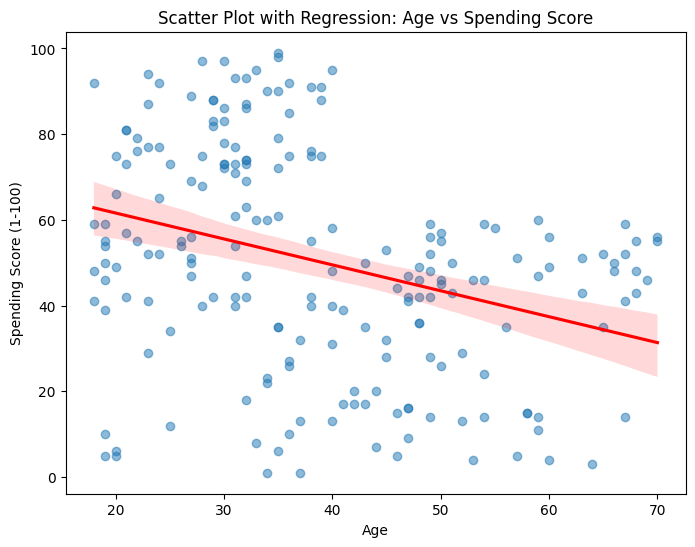

In [13]:

age_spending_corr = data['Age'].corr(data['Spending Score (1-100)'])
print("Correlation Between Age and Spending Score:")
print(f"Correlation: {age_spending_corr:.2f}")

plt.figure(figsize=(8, 6))
sns.regplot(x='Age', y='Spending Score (1-100)', data=data, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('Scatter Plot with Regression: Age vs Spending Score')
plt.xlabel('Age')
plt.ylabel('Spending Score (1-100)')
plt.show()



#### 5. What are the descriptive statistics for annual income?
This histogram shows the distribution of annual income to support the descriptive statistics provided.


Income Distribution Summary:
count    200.000000
mean      60.560000
std       26.264721
min       15.000000
25%       41.500000
50%       61.500000
75%       78.000000
max      137.000000
Name: Annual Income (k$), dtype: float64


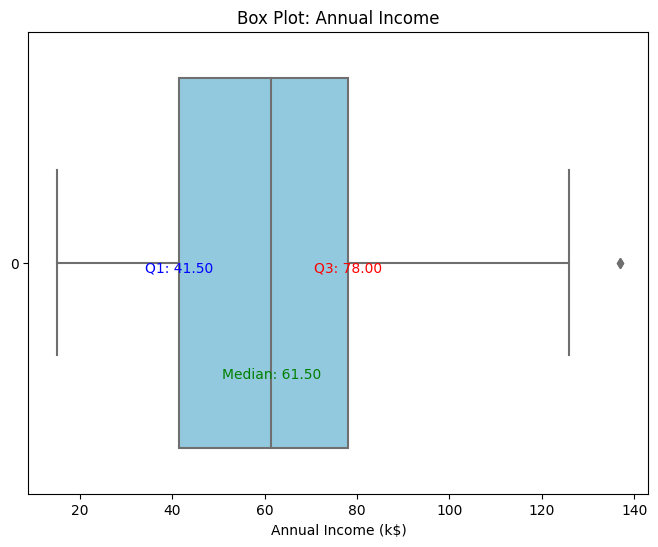

In [14]:

income_summary = data['Annual Income (k$)'].describe()
print("Income Distribution Summary:")
print(income_summary)

plt.figure(figsize=(8, 6))
sns.boxplot(data['Annual Income (k$)'], color='skyblue', orient='h')
plt.title('Box Plot: Annual Income')
plt.xlabel('Annual Income (k$)')

income_summary = data['Annual Income (k$)'].describe()

plt.text(income_summary['25%'], 0.02, f"Q1: {income_summary['25%']:.2f}", ha='center', color='blue', fontsize=10)
plt.text(income_summary['50%'], 0.25, f"Median: {income_summary['50%']:.2f}", ha='center', color='green', fontsize=10)
plt.text(income_summary['75%'], 0.02, f"Q3: {income_summary['75%']:.2f}", ha='center', color='red', fontsize=10)

plt.show()




## Summary and Insights
- Female customers outnumber male customers in the dataset.
- The top 5 customers with the highest spending scores are identified and predominantly younger.
- On average, male customers have a slightly higher annual income than female customers.
- There is a weak negative correlation between age and spending score (-0.33), indicating that younger customers tend to have higher spending scores.
- The annual income distribution is slightly skewed, with most customers earning between \$40k and \$80k.
